<a href="https://colab.research.google.com/github/Sistemc1/Projects/blob/main/Dog_vision_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
print(5+4+4+6)

19


In [ ]:
import pandas as pd
import numpy as np


In [ ]:
from sklearn.ensemble import RandomForestRegressor


In [ ]:
import matplotlib.pyplot as plt

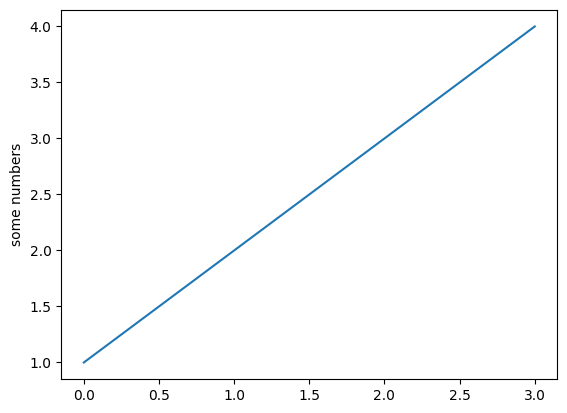

In [ ]:
plt.plot([1, 2, 3, 4])
plt.ylabel('some numbers')
plt.show()



```
# Esto tiene formato de código
```

# Unziping the folder


In [ ]:
# !unzip "/content/drive/MyDrive/verdadera/dog-breed-identification (1).zip" -d
# "drive/MyDrive/verdadera/" %%

# 🐶 End to end multiclass dog breed classification

This note book builds an end to end multiclass image classifier using tensorflow

#Problem

Idententifying the breed of a dog based on a dog's picture.

#Data
From Kaggle https://www.kaggle.com/c/dog-breed-identification/overview

#Evaluation

A file with predictions probabilities
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

#Features

* We are dealing with images (unstructured data), So it's probably better if we use deep learning / transfer learning
* There are 120 different dog breeds (classes)
*10,000 images in the training set with labels.
10,000 images in the test set without labels to be predicted.

#Get out workspace ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [ ]:
print(tf.__version__)
print (hub.__version__)

2.17.0
0.16.1


In [ ]:
print("GPU","available (Yessss!)" if tf.config.list_physical_devices("GPU") else "Not available :(")

GPU available (Yessss!)


# **Getting our data ready**

* In all machine learning models our data needs to be numerical, so we're turning images into tensors

In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/verdadera/labels.csv")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: xlabel='breed'>

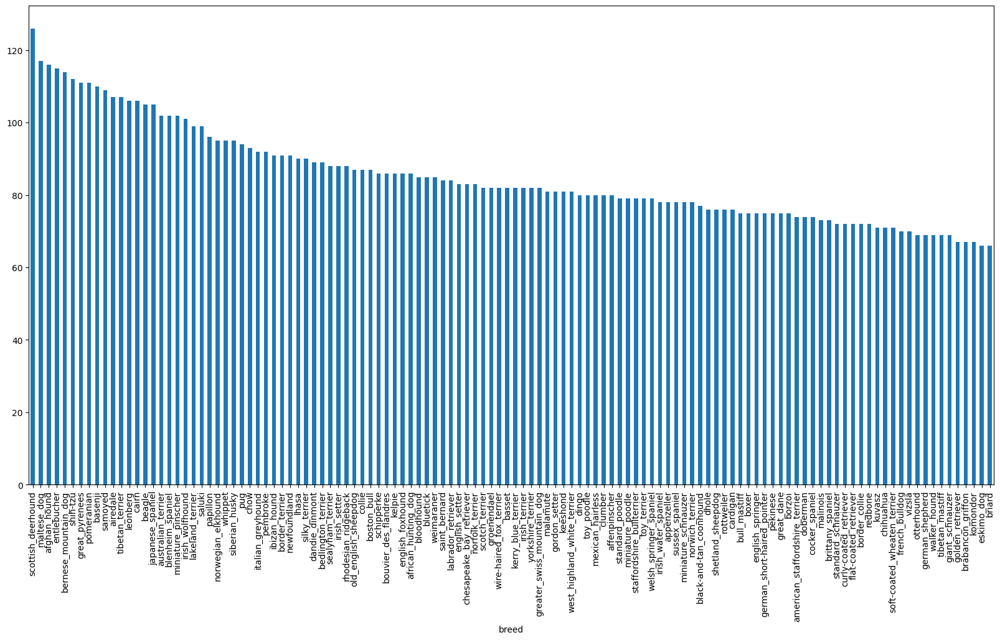

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().mean()

85.18333333333334

In [ ]:
#pip install ipython

In [ ]:
from IPython.display import Image

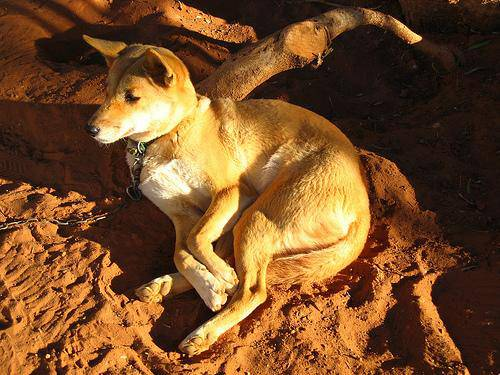

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/verdadera/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

In [ ]:
#

In [ ]:
Image

IPython.core.display.Image

In [ ]:
filenames = ['/content/drive/MyDrive/verdadera/train/'+fname+'.jpg' for fname in labels_csv['id']]

filenames[:10]

['/content/drive/MyDrive/verdadera/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/verdadera/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/verdadera/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/verdadera/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/verdadera/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/verdadera/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/verdadera/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/verdadera/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/verdadera/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/verdadera/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir('/content/drive/MyDrive/verdadera/train')) == len(filenames):
  print("All good")
else: print("Not all good")

All good


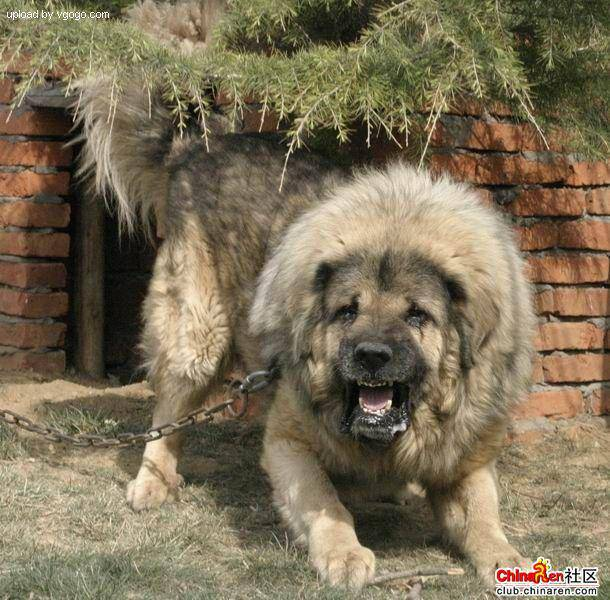

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print("All good")
else: print("Not all good")

All good


In [ ]:
UNIQUE_BREEDS = np.unique(labels)
len(UNIQUE_BREEDS)

120

In [ ]:
UNIQUE_BREEDS

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
bolean_labels = [label == np.array(UNIQUE_BREEDS) for label in labels]
print(labels[:10])
bolean_labels[:10]

['boston_bull' 'dingo' 'pekinese' 'bluetick' 'golden_retriever'
 'bedlington_terrier' 'bedlington_terrier' 'borzoi' 'basenji'
 'scottish_deerhound']


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(len(bolean_labels))
print(len(labels))

10222
10222


In [ ]:
print(labels[0])#original label
print(np.where(UNIQUE_BREEDS==labels[0]))#index where the label occurs
print(bolean_labels[0].argmax())# index where the label occurs in boolean array
print(bolean_labels[0].astype(int)) # It will be an 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])#original label

print(bolean_labels[2].astype(int)) # It will be an 1 where the sample label occurs

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#set up x and y
x= filenames
y = bolean_labels

In [ ]:
len(x),len(y)

(10222, 10222)

We're going to start experimenting on  ~ 1000 images and increase as needed

In [ ]:
# set number of images to use for experimenting
num_of_images = 1000 #@param{type:"slider",min:1000, max:10000,step:1000}

In [ ]:
#le'ts split the data into train,test and validation sets.

from sklearn.model_selection import train_test_split

#split them into train and validation of the total number of images.
x_train,x_val,y_train,y_val = train_test_split(x[:num_of_images],
                                               y[:num_of_images],
                                               test_size=0.2,
                                               random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:10],y_train[:2]

(['/content/drive/MyDrive/verdadera/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/verdadera/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/verdadera/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/verdadera/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/verdadera/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
  '/content/drive/MyDrive/verdadera/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
  '/content/drive/MyDrive/verdadera/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
  '/content/drive/MyDrive/verdadera/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
  '/content/drive/MyDrive/verdadera/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
  '/content/drive/MyDrive/verdadera/train/143b9484273e57668d03bfc26755810a.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, F

# Preprocessing images (turning images into tensors)

to do this we are going to:

1. take image file path as the input/
2. use Tensorflow to read the file and save it to a variable `image`
3. turn our `image` a (jpg) into tensors.
4. Resize the `image` to be (244,244).
5 Return the modified `image`

In [ ]:
#conver an image to a numpy array.

from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
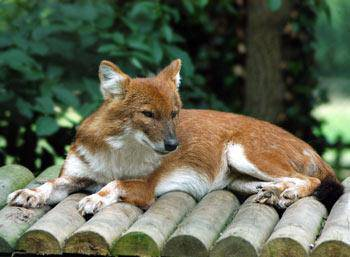

In [ ]:
image

In [ ]:
#Define image size
IMG_size = 224 #@param {type:"integer"}

#Creates a Function to preprocess the images

def process_image(image_path,img_size=IMG_size):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file

  image = tf.io.read_file(image_path)

  # Turn JPEG into numerical tensors with 3 colours channel RGB
  image = tf.image.decode_jpeg(image,channels=3)

  # conver the channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)

  # resize the image to our desired size
  image = tf.image.resize(image,size=[IMG_size,IMG_size])

  return image

# Turning data into batches

Why?

Let's say you are trying to process 10,000+ images in one go, they may not all fit in memory.

That's why we do 32 images at a time

In [ ]:
def get_image_label(image_path,label):
  """
  Takes an image file path name and the assosiated label,
  processes the image and returns a tuple of (image,label)
  """
  image = process_image(image_path)
  return image,label

In [ ]:
#demo

(process_image(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of tensors in the form of (`Image`,`label`), now we'll be creating a function that will convert all of our data (`X`,`Y`) into batches!

In [ ]:

# Define the batch size to 32.
BATCH_SIZE = 32

# Create
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False, shuffle_buffer_size=None):
    """
    Creates batches of data out of image (x) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If data is a test data set, we probably don't have labels
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))  # only filepaths
        data_batch = data.map(process_image).batch(batch_size)  # Assuming process_image is defined
        return data_batch

    # If data is a validation set, we do not need to shuffle it
    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  # filepaths
                                                   tf.constant(y)))  # labels
        data_batch = data.map(get_image_label).batch(batch_size)  # Assuming get_image_label is defined
        return data_batch

    else:
        # If the data is not a test dataset, we shuffle it
        print("Creating training data batches...")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  # filepaths
                                                   tf.constant(y)))  # labels

        # Shuffle the data using a buffer (if provided)
        if shuffle_buffer_size:
            data = data.shuffle(buffer_size=shuffle_buffer_size)
        else:
            # Shuffle with the dataset size as the buffer if not specified
            data = data.shuffle(buffer_size=len(x))

        # Create (image, label) tuples
        data = data.map(get_image_label)
        # Turn the training data into batches
        data_batch = data.batch(batch_size)

        return data_batch

In [ ]:
# creating training & validation data batches

train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches

train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt
# creat a function for viewing the images in a data batch.

def show_25_images(images,labels):
  """
  Displays 25 images from a data batch.
  """
  # set up the figure
  plt.figure(figsize=(10,10))
  # loop through 25 images
  for i in range(25):
    # creat subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # display an image
    plt.imshow(images[i])
    #add the breed as the title
    plt.title(UNIQUE_BREEDS[labels[i].argmax()])
    # turn the grid lines off
    plt.axis("off")



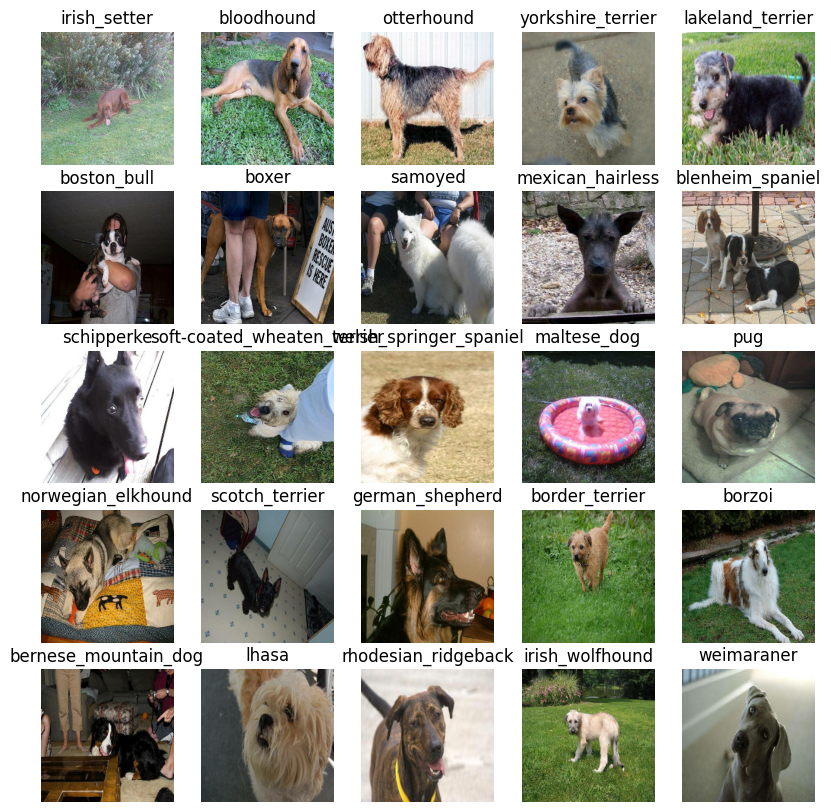

In [ ]:
train_images,train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

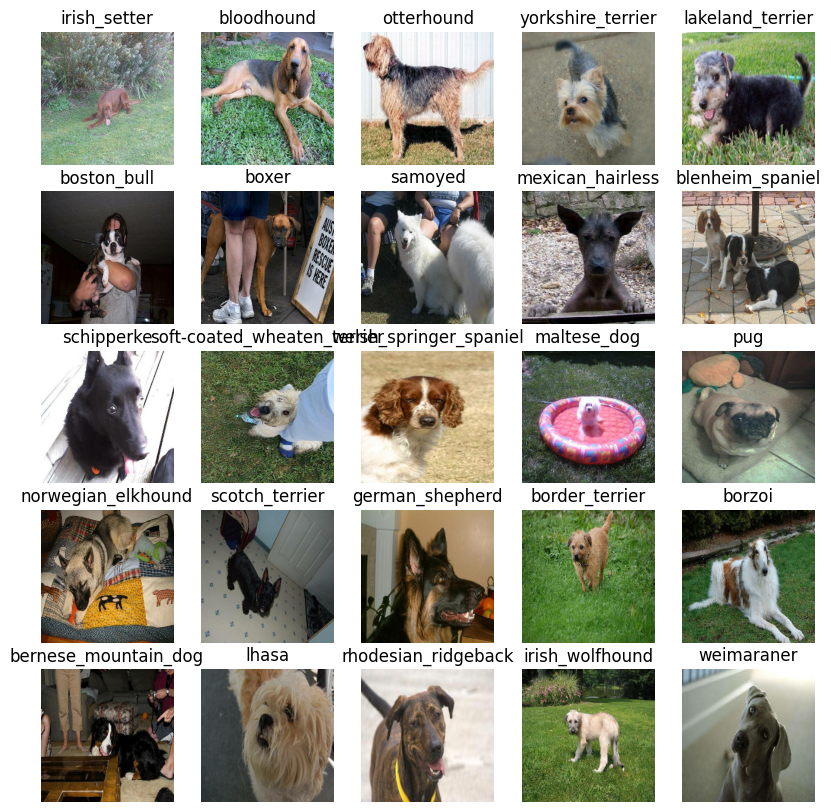

In [ ]:
show_25_images(train_images,train_labels)

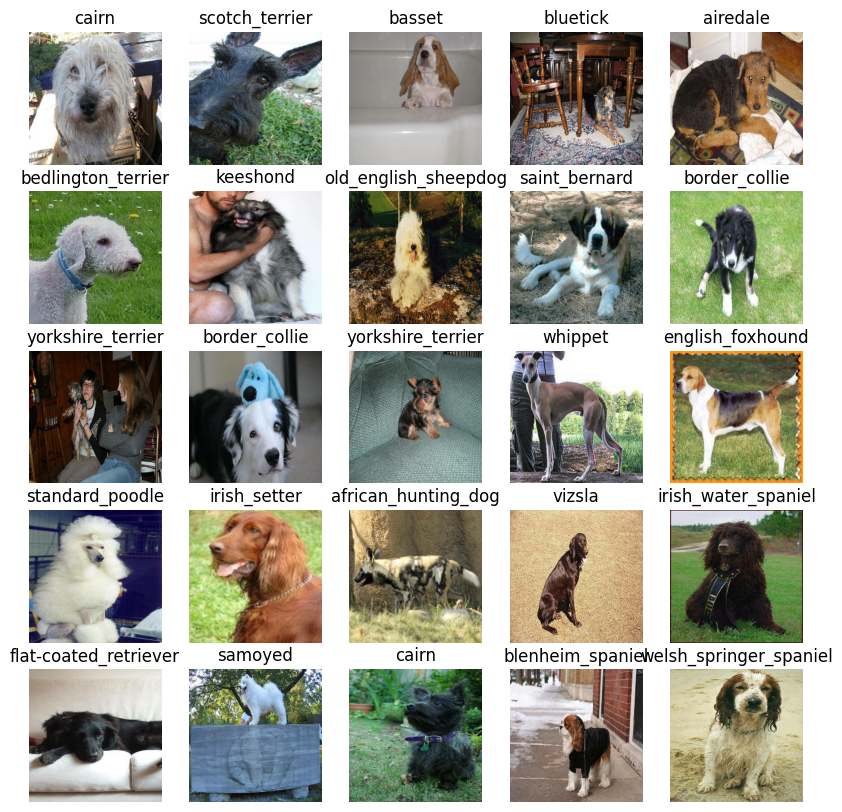

In [ ]:
#now let's visualize our val set

val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

# Building our model

before we creat a model there are a few things to take into consideration.


1.   Input shape (our images shape in the form of tensors) to our model.
2.   output shape (our imagelabels shape in the form of tensors) to our model.
3.   The URL of the model we want to use.(from tensorflow hub)



In [ ]:
#set up input shape to out model.

INPUT_SHAPE = (IMG_size,IMG_size,3) #batch,height,with and colour channels

# Set up outpunt shape to our model.

OUTPUT_SHAPE = len(UNIQUE_BREEDS)

# Set up the model URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5" #@param {type:"string"}

Now we have our inpunt, output,model ready to go, let's put them together into a Keras deep learning model!

Knowing this let's create a function that does this:

* takes the input,output shapes and the model as parameters.
* Defines the layers in a Keras model in a sequential fashion.
* Compiles the model. (says it should be evaluated and improved).
* Builds the model. (tells the model the input shape it'll be getting)
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

What's happening here?

#### Setting up the model layers

There are two ways to do this in Keras, the [functional](https://www.tensorflow.org/guide/keras/functional) and [sequential API](https://www.tensorflow.org/guide/keras/overview#build_a_simple_model). We've used the sequential.

Which one should you use?

The Keras documentation states the functional API is the way to go for defining complex models but the sequential API (a linear stack of layers) is perfectly fine for getting started, which is what we're doing.

The first layer we use is the model from TensorFlow Hub (`hub.KerasLayer(MODEL_URL)`. So our first layer is actually an entire model (many more layers). This **input layer** takes in our images and finds patterns in them based on the patterns [`mobilenet_v2_130_224`](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4) has found.

The next layer (`tf.keras.layers.Dense()`) is the **output layer** of our model. It brings all of the information discovered in the input layer together and outputs it in the shape we're after, 120 (the number of unique labels we have).

The `activation="softmax"` parameter tells the output layer, we'd like to assign a probability value to each of the 120 labels [somewhere between 0 & 1](https://en.wikipedia.org/wiki/Softmax_function). The higher the value, the more the model believes the input image should have that label. If we were working on a binary classification problem, we'd use `activation="sigmoid"`.

For more on which activation function to use, see the article [Which Loss and Activation Functions Should I Use](https://towardsdatascience.com/deep-learning-which-loss-and-activation-functions-should-i-use-ac02f1c56aa8)?

#### Compiling the model

This one is best explained with a story.

Let's say you're at the international hill descending championships. Where your start standing on top of a hill and your goal is to get to the bottom of the hill. The catch is you're blindfolded.

Luckily, your friend Adam is standing at the bottom of the hill shouting instructions on how to get down.

At the bottom of the hill there's a judge evaluating how you're doing. They know where you need to end up so they compare how you're doing to where you're supposed to be. Their comparison is how you get scored.

Transferring this to `model.compile()` terminology:
* `loss` - The height of the hill is the loss function, the models goal is to minimize this, getting to 0 (the bottom of the hill) means the model is learning perfectly.
* `optimizer` - Your friend Adam is the optimizer, he's the one telling you how to navigate the hill (lower the loss function) based on what you've done so far. His name is Adam because the [Adam optimizer](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/) is a great general which performs well on most models. Other optimizers include [RMSprop](https://ruder.io/optimizing-gradient-descent/index.html#rmsprop) and [Stochastic Gradient Descent](https://en.wikipedia.org/wiki/Stochastic_gradient_descent).
* `metrics` - This is the onlooker at the bottom of the hill rating how well your perfomance is. Or in our case, giving the accuracy of how well our model is predicting the correct image label.

#### Building the model

We use `model.build()` whenever we're using a layer from TensorFlow Hub to tell our model what input shape it can expect.

In this case, the input shape is `[None, IMG_SIZE, IMG_SIZE, 3]` or `[None, 224, 224, 3]` or `[batch_size, img_height, img_width, color_channels]`.

Batch size is left as `None` as this is inferred from the data we pass the model. In our case, it'll be 32 since that's what we've set up our data batches as.

Now we've gone through each section of the function, let's use it to create a model.

We can call `summary()` on our model to get idea of what our model looks like.

In [ ]:
# import tensorflow as tf
# import tensorflow_hub as hub

# # Set up input and output shapes
# INPUT_SHAPE = (224, 224, 3)  # Model expects 224x224 images
# OUTPUT_SHAPE = 120  # 120 unique classes

# # Set up the model URL (for feature extraction)
# MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5"

# # Create a function to build the Keras model using Functional API
# def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
#     print("Building model with:", model_url)

#     # Define input layer
#     inputs = tf.keras.Input(shape=input_shape)

#     # Add a rescaling layer (normalizes pixel values between 0 and 1)
#     rescaling_layer = tf.keras.layers.Rescaling(1./255)(inputs)

#     # Load the feature extractor from TensorFlow Hub
#     feature_extractor_layer = hub.KerasLayer(model_url, trainable=False)(rescaling_layer)

#     # Ensure the output from the feature extractor is flattened
#     feature_extractor_flat = tf.keras.layers.Flatten()(feature_extractor_layer)

#     # Add the output layer (Dense layer for classification)
#     outputs = tf.keras.layers.Dense(units=output_shape, activation="softmax")(feature_extractor_flat)

#     # Create the model
#     model = tf.keras.Model(inputs=inputs, outputs=outputs)

#     # Compile the model
#     model.compile(
#         loss=tf.keras.losses.CategoricalCrossentropy(),  # Loss function
#         optimizer=tf.keras.optimizers.Adam(),  # Optimizer
#         metrics=["accuracy"]  # Metric to track
#     )

#     return model

# # Create and summarize the model
# try:
#     model = create_model()
#     model.summary()
# except Exception as e:
#     print("Error:", e)


In [ ]:
# !pip install tensorflow==2.17.0 tensorflow-hub


In [ ]:
import tensorflow as tf

# Set up input and output shapes
INPUT_SHAPE = (224, 224, 3)  # Model expects 224x224 images
OUTPUT_SHAPE = 120  # 120 unique classes

# Load MobileNet V2 from Keras Applications
base_model = tf.keras.applications.MobileNetV2(input_shape=INPUT_SHAPE, include_top=False, weights='imagenet')

# Freeze the base model
base_model.trainable = False

# Create a function to build the Keras model
def create_model(base_model, output_shape=OUTPUT_SHAPE):
    # Define input layer
    inputs = tf.keras.Input(shape=INPUT_SHAPE)

    # Add the base model (feature extractor)
    x = base_model(inputs, training=False)  # Use base model in inference mode
    x = tf.keras.layers.GlobalAveragePooling2D()(x)  # Add a pooling layer
    outputs = tf.keras.layers.Dense(units=output_shape, activation="softmax")(x)  # Output layer

    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),  # Loss function
        optimizer=tf.keras.optimizers.Adam(),  # Optimizer
        metrics=["accuracy"]  # Metric to track
    )

    return model

# Create and summarize the model
try:
    model = create_model(base_model)
    model.summary()
except Exception as e:
    print("Error:", e)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
outputs = np.ones(shape=(1,1228))
outputs

array([[1., 1., 1., ..., 1., 1., 1.]])

In [ ]:
import tensorflow as tf

# Set up input and output shapes
INPUT_SHAPE = (224, 224, 3)  # Model expects 224x224 images
OUTPUT_SHAPE = 120  # 120 unique classes

# Load MobileNet V2 from Keras Applications
base_model = tf.keras.applications.MobileNetV2(input_shape=INPUT_SHAPE, include_top=False, weights='imagenet')

# Freeze the base model
base_model.trainable = False

# Create a function to build the Keras model
def create_model(base_model, output_shape=OUTPUT_SHAPE):
    # Define input layer
    inputs = tf.keras.Input(shape=INPUT_SHAPE)

    # Add the base model (feature extractor)
    x = base_model(inputs, training=False)  # Use base model in inference mode
    x = tf.keras.layers.GlobalAveragePooling2D()(x)  # Add a pooling layer
    outputs = tf.keras.layers.Dense(units=output_shape, activation="softmax")(x)  # Output layer

    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),  # Loss function
        optimizer=tf.keras.optimizers.Adam(),  # Optimizer
        metrics=["accuracy"]  # Metric to track
    )

    return model

# Create and summarize the model
try:
    model = create_model(base_model)
    model.build(INPUT_SHAPE)  # Asegúrate de que el modelo esté construido
    model.summary()
    print("Model built:", model.built)  # Esto debería ser True
except Exception as e:
    print("Error:", e)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Model built: True


In [ ]:
%load_ext tensorboard

The non-trainable parameters are the patterns learned by mobilenet_v2_130_224 and the trainable parameters are the ones in the dense layer we added.

This means the main bulk of the information in our model has already been learned and we're going to take that and adapt it to our own problem.

# Creating callbacks
We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

TensorBoard Callback
TensorBoard helps provide a visual way to monitor the progress of your model during and after training.

It can be used directly in a notebook to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

Load the TensorBoard notebook extension.
Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

In [ ]:
import datetime
def create_tensorboard_callback():
    log_dir = os.path.join("/content/drive/MyDrive/verdadera/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(log_dir=log_dir)


**Early Stopping Callback**

Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [ ]:
#create an early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

# Training a model (on a subset of data)
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

The final parameter we'll define before training is NUM_EPOCHS (also known as number of epochs).

NUM_EPOCHS defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If NUM_EPOCHS=1, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself. It would be like you competing in the international hill descent championships and your friend Adam only being able to give you 1 single instruction to get down the hill.

What's a good value for NUM_EPOCHS?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set NUM_EPOCHS to 100 but our model stops improving after 22 epochs, it'll stop training.

Along with this, let's quickly check if we're still using a GPU.

In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


**Boom! We've got a GPU running and NUM_EPOCHS setup. Let's create a simple function which trains a model. The function will:**

Create a model using create_model().
Setup a TensorBoard callback using create_tensorboard_callback() (we do this here so it creates a log directory of the current date and time).
Call the fit() function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
Return the fitted model.

In [ ]:
def train_model():
  '''Trains a given model and returns the trained version.'''
  # Create a model
  model = create_model(base_model)

  #create a new tensorboard session everytime we train the model.

  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq = 1,
            callbacks=[tensorboard,early_stopping])

  return model

  # Create a new model checkpoint

  #checkpoint_path = "model_checkpoints/weights.hdf5"

In [ ]:
model = train_model()

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 184s 7s/step - accuracy: 0.0487 - loss: 4.9063 - val_accuracy: 0.2250 - val_loss: 3.6278
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 26s 142ms/step - accuracy: 0.5746 - loss: 2.2428 - val_accuracy: 0.4850 - val_loss: 2.4655
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - accuracy: 0.9054 - loss: 0.9687 - val_accuracy: 0.5450 - val_loss: 2.0227
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 183ms/step - accuracy: 0.9855 - loss: 0.5048 - val_accuracy: 0.5450 - val_loss: 1.8393
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - accuracy: 0.9903 - loss: 0.3229 - val_accuracy: 0.6100 - val_loss: 1.7181
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - accuracy: 0.9976 - loss: 0.2082 - val_accuracy: 0.6000 - val_loss: 1.6522
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - accuracy: 0.9986 - loss: 0.1563 - val_accuracy: 0.6050 - val_loss: 1.6296
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - accuracy: 1.0000 - loss: 0.1170 - val_accu

**Question:** It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? Hint: this may involve searching something like "ways to prevent overfitting in a deep learning model?".

**Note:** Overfitting to begin with is a good thing. It means our model is learning something.

# Checking the TensorBoard logs
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and viualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/verdadera/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 526ms/step


array([[2.1357166e-03, 1.4408308e-03, 3.0955073e-04, ..., 7.5980228e-05,
        3.2833306e-04, 1.1607044e-03],
       [6.3171884e-04, 2.4901896e-03, 6.3166437e-03, ..., 2.3193918e-04,
        2.2344302e-02, 3.7347697e-04],
       [7.6057026e-06, 4.0014184e-04, 1.8374340e-04, ..., 3.9676182e-05,
        1.5845911e-04, 1.1444723e-03],
       ...,
       [6.8889972e-04, 1.9466726e-03, 6.5211114e-04, ..., 5.0906633e-04,
        1.6254011e-04, 6.3142821e-04],
       [2.6577554e-04, 1.2015713e-04, 1.1525891e-04, ..., 4.6100202e-05,
        1.4559188e-04, 5.9748143e-03],
       [1.6860900e-04, 2.0986778e-05, 3.7195344e-04, ..., 9.9253585e-04,
        6.8287918e-04, 2.0367144e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# First predictions
index = 113
print(predictions[index])
print(f'Max value (probability of prediction):{np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {UNIQUE_BREEDS[np.argmax(predictions[index])]}')

[7.6132186e-04 2.5986700e-04 1.3451990e-04 5.8685783e-03 1.8423042e-04
 9.1294687e-06 1.5519525e-01 9.3880878e-04 3.4398132e-04 1.1415652e-04
 2.7488632e-04 6.6212699e-04 5.8545484e-05 4.4945162e-04 2.3647578e-04
 6.0820392e-05 2.6996326e-05 1.2127397e-01 1.0950386e-04 4.1171981e-05
 6.2810106e-04 4.6779292e-05 1.4641251e-04 1.2098020e-03 9.0784106e-06
 4.9756516e-05 5.0280817e-02 2.3985180e-04 2.4352137e-04 1.0510634e-02
 1.0615087e-04 8.6846519e-03 6.0262170e-04 1.6874248e-04 5.6703144e-04
 1.7129201e-02 3.2429237e-04 2.6929716e-04 2.9727527e-05 1.4658589e-04
 9.9264039e-04 3.1035768e-07 7.3527859e-05 2.1796362e-05 2.3932193e-04
 1.4229797e-05 4.7372665e-05 4.5979247e-04 9.8906145e-05 3.2896244e-03
 2.0993373e-04 9.7235679e-05 5.6533949e-03 1.0006957e-05 6.1694278e-05
 8.3976620e-06 2.4654894e-04 3.7198768e-03 1.4287050e-04 1.9869581e-03
 1.9046175e-04 1.8076236e-04 4.0620038e-05 1.0883350e-04 9.4339281e-05
 6.3428874e-05 3.8350475e-04 5.5866942e-05 1.9863902e-02 1.0530331e-04
 8.776

In [ ]:
UNIQUE_BREEDS[119]

'yorkshire_terrier'

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

Note: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return UNIQUE_BREEDS[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'lhasa'

Wonderful! Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the fit() function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

Let's make a small function to do so.

In [ ]:
images_v= []
labels_= []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_v.append(image)
  labels_.append(label)

In [ ]:
images_v[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'lhasa'

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate lists
  of images and labels.
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(UNIQUE_BREEDS[np.argmax(label)])
  return images, labels

  # Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Nailed it!

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:
* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred_prob(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  #plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

 # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


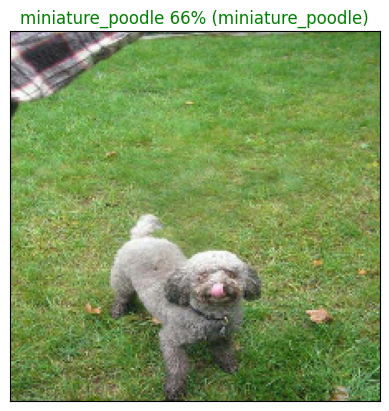

In [ ]:
plot_pred_prob(prediction_probabilities= predictions,labels= val_labels,images = val_images,n = 60)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

Take an input of a prediction probabilities array, a ground truth labels array and an integer.
Find the predicted label using get_pred_label().

*   Elemento de la lista
*   Elemento de la lista


Find the top 10:
Prediction probabilities indexes
Prediction probabilities values
Prediction labels
Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction probability values and labels,
  and displays the true label value.
  """
  preb_prob, true_label, = prediction_probabilities[n], labels[n]
  #get predicted label
  pred_label = get_pred_label(preb_prob)
  #find the top 10 prediction confidence indexes

  top_10_pred_indexes = preb_prob.argsort()[-10:][::-1]

  # find top 10 prediction confidence values

  top_10_pred_values = preb_prob[top_10_pred_indexes]
  # find top 10 predictions labels
  top_10_pred_labels = UNIQUE_BREEDS[top_10_pred_indexes]
# set up a plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
      pass


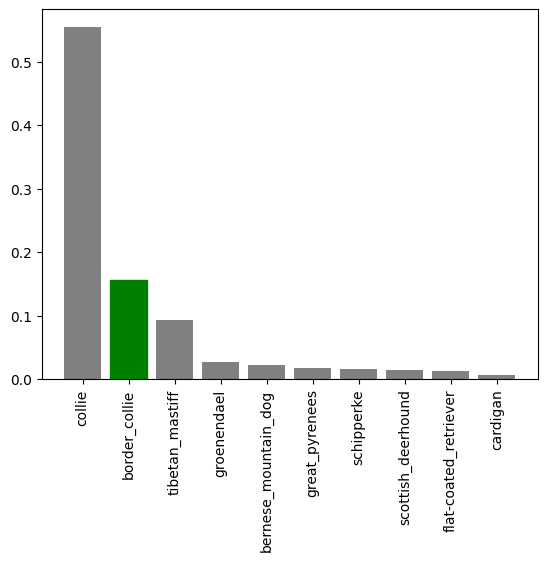

In [ ]:
plot_pred_conf(prediction_probabilities= predictions,labels= val_labels,n = 9)

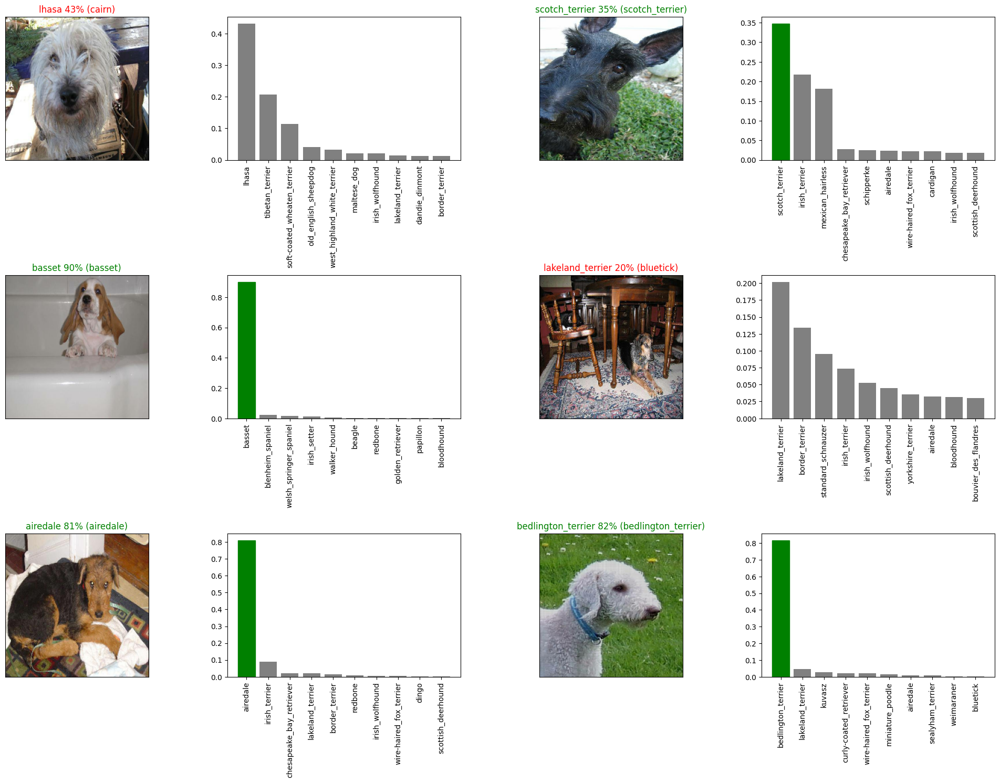

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred_prob(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
## Saving and loading a model

## Saving and loading a model

In [ ]:
## create a function to save a model

def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/verdadera/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# create a funtion to load a trained model

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model,suffix="test")

Saving model to: /content/drive/MyDrive/verdadera/models/20241112-15181731424722-test.h5...


'/content/drive/MyDrive/verdadera/models/20241112-15181731424722-test.h5'

In [ ]:
loaded_1000_image_model = load_model('/content/drive/MyDrive/verdadera/models/20241112-15181731424722-test.h5')

Loading saved model from: /content/drive/MyDrive/verdadera/models/20241112-15181731424722-test.h5


In [ ]:
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - accuracy: 0.6503 - loss: 1.4753


[1.5282782316207886, 0.6299999952316284]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 484ms/step - accuracy: 0.6503 - loss: 1.4753


[1.5282782316207886, 0.6299999952316284]

##Training a model (on the full data)
Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to X and all of the training labels to y. Let's check them out.

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
## create a full data batch

full_data = create_data_batches(x,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a model

full_model = create_model(base_model)

In [ ]:
# create full model call back
full_model_tensorboard = create_tensorboard_callback()
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
# fit the full model to the full data

full_model.fit(x=full_data,
              epochs=NUM_EPOCHS,
              callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1556s 5s/step - accuracy: 0.4393 - loss: 2.5373
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 73s 132ms/step - accuracy: 0.8430 - loss: 0.5715
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 94s 168ms/step - accuracy: 0.9091 - loss: 0.3561
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - accuracy: 0.9444 - loss: 0.2546
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - accuracy: 0.9655 - loss: 0.1854
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 138ms/step - accuracy: 0.9834 - loss: 0.1325
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 139ms/step - accuracy: 0.9919 - loss: 0.0977
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - accuracy: 0.9948 - loss: 0.0793
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 138ms/step - accuracy: 0.9984 - loss: 0.0595
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 141ms/step - accuracy: 0.9983 - loss: 0.0483
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 137ms/step - accuracy: 0.9987 - loss: 0.0415
Epoch 12/

In [ ]:
save_model(full_model,suffix="Full_image_model")

Saving model to: /content/drive/MyDrive/verdadera/models/20241112-16271731428840-Full_image_model.h5...


'/content/drive/MyDrive/verdadera/models/20241112-16271731428840-Full_image_model.h5'

In [ ]:
loaded_full_model = load_model('/content/drive/MyDrive/verdadera/models/20241112-16271731428840-Full_image_model.h5')

Loading saved model from: /content/drive/MyDrive/verdadera/models/20241112-16271731428840-Full_image_model.h5


##Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

Get the test image filenames.
Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since there are no labels with the test images).
Make a predictions array by passing the test data batches to the predict() function.

In [ ]:
test_path = "/content/drive/MyDrive/verdadera/test"
test_filenames = [test_path + "/" + f for f in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/verdadera/test/df2b5cee4b3d8a3cb893b668df16d572.jpg',
 '/content/drive/MyDrive/verdadera/test/e298c484aa05012775db02f3596e1d18.jpg',
 '/content/drive/MyDrive/verdadera/test/e73d52671c56e1507fed58c4c287d5f1.jpg',
 '/content/drive/MyDrive/verdadera/test/df2a003a0b1a216effd806f03f703859.jpg',
 '/content/drive/MyDrive/verdadera/test/de59703200e1b19b520033e76dea9b62.jpg',
 '/content/drive/MyDrive/verdadera/test/e22db0abd7c039726b9683fc0a372204.jpg',
 '/content/drive/MyDrive/verdadera/test/e6e1e02b07347a522f96eba87d29a5c0.jpg',
 '/content/drive/MyDrive/verdadera/test/e6343c835d2d07d7f3ac962b92415743.jpg',
 '/content/drive/MyDrive/verdadera/test/e4e71046e4dce90d4b4790e9819d2d82.jpg',
 '/content/drive/MyDrive/verdadera/test/de85fdcf74dbe025b9b89819735cb9bc.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data_batches = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data_batches

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Note: Since there are 10,000+ test images, making predictions could take a while, even on a GPU. So beware running the cell below may take up to an hour.

In [ ]:
test_predictions = full_model.predict(test_data_batches,verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 1777s 5s/step


In [ ]:
np.savetxt('/content/drive/MyDrive/verdadera/preds_array.csv', test_predictions,delimiter = ",")

In [ ]:
test_predictions_ = np.loadtxt('/content/drive/MyDrive/verdadera/preds_array.csv', delimiter=',')

In [ ]:
test_predictions_[10]

array([2.21752998e-08, 2.65112043e-09, 2.60143160e-08, 1.24004487e-06,
       3.83281806e-09, 1.50726525e-08, 9.69467387e-02, 4.05729352e-08,
       1.03563139e-07, 3.39388656e-10, 3.62210900e-10, 3.19621535e-07,
       2.89796603e-10, 1.26190569e-09, 2.86913737e-09, 2.07952211e-10,
       4.14479978e-10, 5.92527977e-06, 3.35943690e-10, 3.33992972e-11,
       3.09832693e-09, 6.27066932e-09, 4.67198078e-07, 3.03542549e-07,
       3.79090176e-10, 3.26699556e-10, 1.52572795e-06, 1.82638985e-06,
       4.00115774e-10, 7.41621164e-08, 1.19050945e-07, 2.20723684e-09,
       5.06104758e-09, 7.77620880e-06, 8.08750775e-11, 1.27775832e-06,
       3.13821893e-08, 2.49945309e-09, 2.26382680e-11, 1.29688578e-11,
       3.25769300e-10, 2.10066838e-12, 2.14454552e-08, 5.62375591e-10,
       8.17985235e-09, 2.06573328e-10, 4.59985984e-07, 1.25986450e-12,
       3.04507031e-10, 1.76283397e-08, 4.21468727e-08, 4.58499683e-10,
       3.01480507e-10, 1.49259116e-09, 1.80661075e-09, 1.00490814e-11,
      

In [ ]:
test_predictions_.shape

(10357, 120)

##Preparing test dataset predictions for Kaggle¶

Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:

Create a pandas DataFrame with an ID column as well as a column for each dog breed.
Add data to the ID column by extracting the test image ID's from their filepaths.
Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
preds_df = pd.DataFrame(columns=['ID']+list(UNIQUE_BREEDS))

In [ ]:
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["ID"]= test_ids

In [ ]:
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df2b5cee4b3d8a3cb893b668df16d572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e298c484aa05012775db02f3596e1d18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e73d52671c56e1507fed58c4c287d5f1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,df2a003a0b1a216effd806f03f703859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,de59703200e1b19b520033e76dea9b62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(UNIQUE_BREEDS)] = test_predictions
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df2b5cee4b3d8a3cb893b668df16d572,1.002040e-06,2.609128e-08,4.299215e-08,3.068123e-09,3.200900e-09,1.624713e-09,6.039859e-09,7.023525e-09,7.663306e-11,...,3.005292e-06,7.469765e-08,1.009427e-10,1.748546e-14,2.367509e-09,8.004806e-10,2.300576e-08,1.443591e-07,6.412275e-07,8.983223e-06
1,e298c484aa05012775db02f3596e1d18,2.404491e-08,5.176365e-06,8.197038e-08,8.009454e-04,3.380311e-12,1.648587e-10,7.919066e-07,1.342105e-11,1.903827e-07,...,5.678689e-09,1.294807e-08,1.468739e-09,4.953271e-11,6.753701e-09,1.825138e-06,3.021769e-12,4.007187e-05,7.000709e-06,9.090122e-03
2,e73d52671c56e1507fed58c4c287d5f1,7.089805e-06,9.813369e-07,1.231409e-07,1.771563e-07,4.906331e-09,1.089933e-03,4.878354e-06,4.321780e-08,1.106588e-07,...,3.800249e-07,1.244207e-08,7.880565e-09,2.339877e-07,1.802387e-08,1.381320e-06,4.223633e-07,1.604118e-09,3.650754e-08,1.873053e-08
3,df2a003a0b1a216effd806f03f703859,1.699639e-10,4.469934e-09,2.618691e-14,1.126240e-10,1.051164e-16,6.611290e-09,4.925762e-12,3.426803e-14,5.921999e-11,...,3.329762e-11,5.196841e-15,2.998647e-10,2.176852e-09,1.993208e-12,1.413578e-10,1.612747e-14,1.280987e-14,1.188285e-14,1.294656e-14
4,de59703200e1b19b520033e76dea9b62,4.297559e-07,2.813826e-11,1.003127e-06,2.038938e-06,3.274961e-06,1.488262e-07,4.240686e-06,5.528463e-04,4.843856e-06,...,1.260549e-07,8.327621e-05,1.158328e-07,5.395788e-07,1.302288e-05,8.418329e-09,2.192921e-06,4.062896e-02,7.105385e-07,2.028315e-05


In [ ]:
#save our predictions to CSV
preds_df.to_csv("/content/drive/MyDrive/verdadera/full_model_submission_JD_mobilnetV2.csv",index=False)

##Making predictions on custom images¶
It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:

Get the filepaths of our own images.
Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
Pass the custom image data batch to our model's predict() method.
Convert the prediction output probabilities to prediction labels.
Compare the predicted labels to the custom images.
Note: To make predictions on custom images, I've uploaded pictures of my own to a directory located at drive/My Drive/Data/dogs/ (as seen in the cell below). In order to make predictions on your own images, you will have to do something similar.

In [ ]:
custom_path = "/content/drive/MyDrive/verdadera/prueba22"
# Agregar '/' para construir rutas correctamente
custom_image_paths = [os.path.join(custom_path, fname) for fname in os.listdir(custom_path)]
custom_image_paths


['/content/drive/MyDrive/verdadera/prueba22/perro3.jpeg',
 '/content/drive/MyDrive/verdadera/prueba22/perro1.jpeg',
 '/content/drive/MyDrive/verdadera/prueba22/perro2.jpeg',
 '/content/drive/MyDrive/verdadera/prueba22/un-perro-de-raza-labrador.jpeg',
 '/content/drive/MyDrive/verdadera/prueba22/imagen-destacada-blog-cremalia-problemas-psicologicos-perros-800x420.fw_.jpg',
 '/content/drive/MyDrive/verdadera/prueba22/ejercicio-canino.jpg']

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


In [ ]:
custom_preds.shape

(6, 120)

In [ ]:
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels


['eskimo_dog',
 'pug',
 'golden_retriever',
 'labrador_retriever',
 'chihuahua',
 'golden_retriever']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

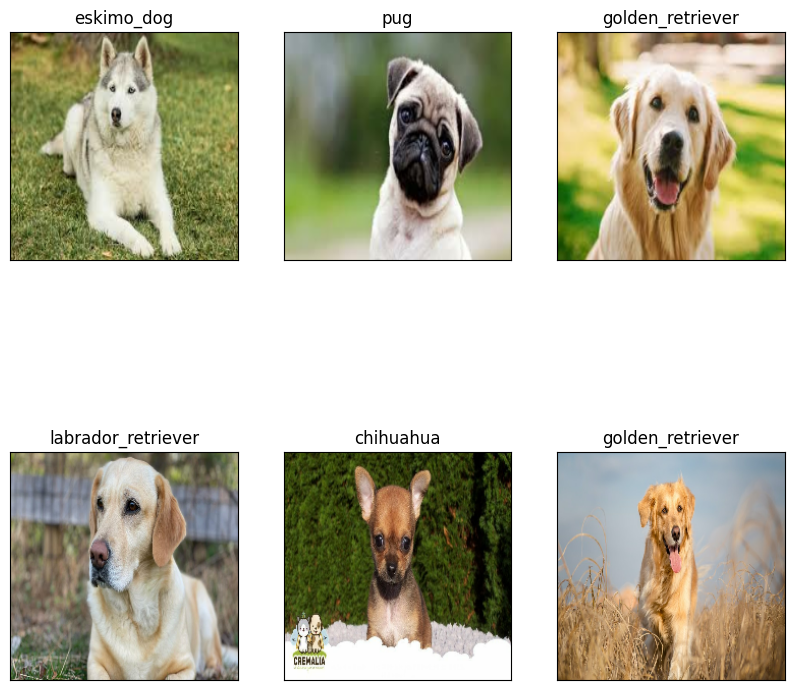

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(2, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)